# Exercises


## Image Processing

* Apply AWGN to an image and then evaluate what filter between: Gaussian, Median, Sharpening and Resizing better attenuate the noise induced by the AWGN
* Convert a RGB image into YCbCr, apply compressions and other processing and evaluate which components deteriorate the most the resulting RGB image.
* Extract edges from an image and localize in these regions an attack.

In [16]:
#PSNR

import cv2
import numpy as np
from scipy.signal import convolve2d
from math import sqrt

def PSNR(img1, img2):
  img1 = np.float32(img1)/255.0
  img2 = np.float32(img2)/255.0
  difference = img1-img2
  same = not np.any(difference)
  if same is True:
      return 9999999
  w = np.genfromtxt('csf.csv', delimiter=',')
  ew = convolve2d(difference, np.rot90(w,2), mode='valid')
  decibels = 20.0*np.log10(1.0/sqrt(np.mean(np.mean(ew**2))))
  return decibels


<class 'PIL.JpegImagePlugin.JpegImageFile'>
<class 'numpy.ndarray'>


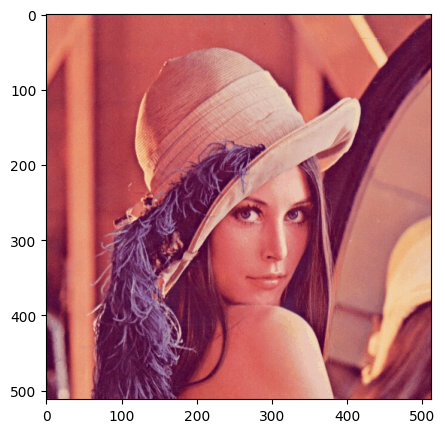

Image shape:  (512, 512, 3)


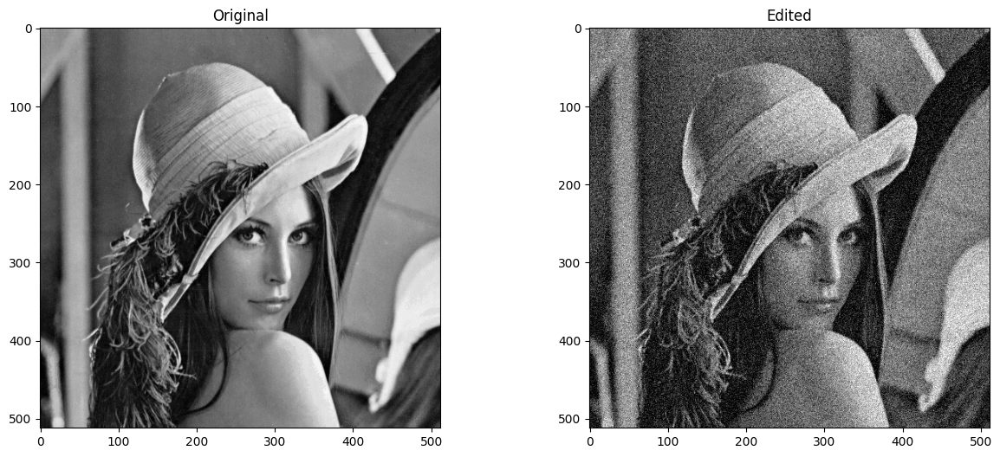

9999999
33.93351625313363


In [17]:
import os
from PIL import Image
import matplotlib.pyplot as plt #to display images
import matplotlib
matplotlib.rcParams['figure.figsize'] = [5, 5]
image = Image.open('lena_color.jpg') #using pillow
print(type(image))
im = np.asarray(image,dtype=np.uint8)
print(type(im))
plt.imshow(im)
plt.show()

#AWGN

original = Image.open('lena_color.jpg')
original = np.asarray(original,dtype=np.uint8)
print('Image shape: ', original.shape)

def awgn(img, std, seed):
  mean = 0.0   # some constant
  np.random.seed(seed)
  attacked = img + np.random.normal(mean, std, img.shape)
  attacked = np.clip(attacked, 0, 255)
  return attacked

attacked = awgn(original[:,:,1], 30.0, 123)

# Show orginal and edited images side by side

plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Original')
plt.imshow(original[:,:,1], cmap='gray')
plt.subplot(122)
plt.title('Edited')
plt.imshow(attacked, cmap='gray')
plt.show()

print(PSNR(original[:,:,1], original[:,:,1]))
print(PSNR(attacked, original[:,:,1]))

/tmp/ipykernel_3274/2821716198.py:4: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


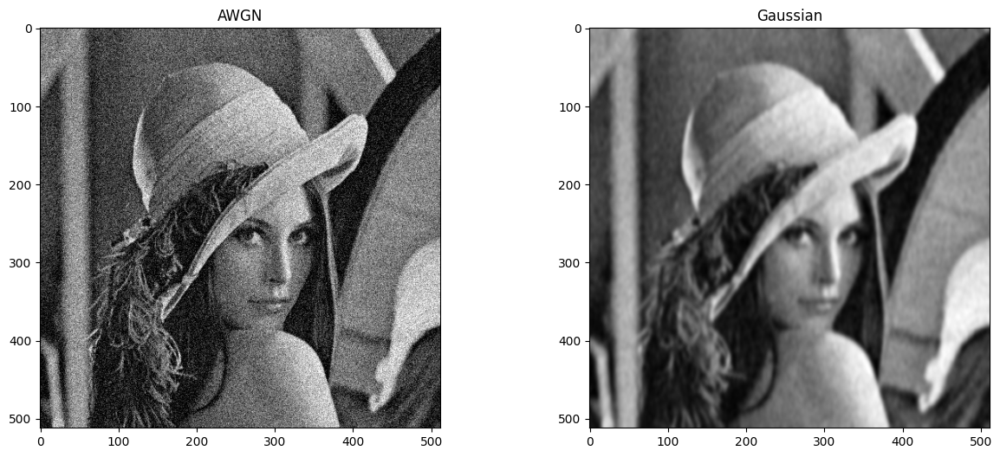

32.84651558074528


In [18]:
#Gaussian Filter

def blur(attacked, sigma):
  from scipy.ndimage.filters import gaussian_filter
  attackedGaussian = gaussian_filter(attacked, sigma)
  return attackedGaussian

attackedGaussian = blur(attacked, [3, 2])

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('AWGN')
plt.imshow(attacked, cmap='gray')
plt.subplot(122)
plt.title('Gaussian')
plt.imshow(attackedGaussian, cmap='gray')
plt.show()

print(PSNR(attackedGaussian, original[:,:,1]))

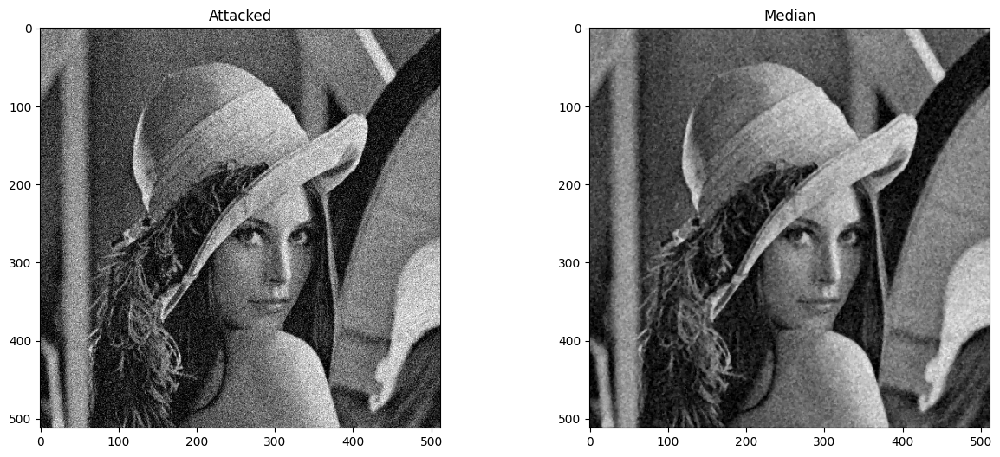

34.544884811097546


In [19]:
#Median Filter

def median(attacked, kernel_size):
  from scipy.signal import medfilt
  attackedMedian = medfilt(attacked, kernel_size)
  return attackedMedian

attackedMedian = median(attacked, [3, 3])

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Attacked')
plt.imshow(attacked, cmap='gray')
plt.subplot(122)
plt.title('Median')
plt.imshow(attackedMedian, cmap='gray')
plt.show()

print(PSNR(attackedMedian, original[:,:,1]))

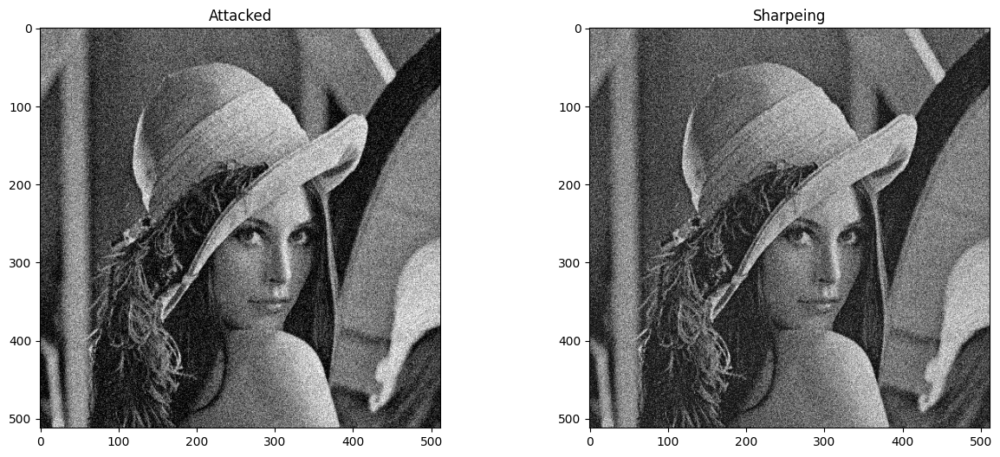

32.56874380559693


In [20]:
# Sharpening Filter

def sharpening(attacked, sigma, alpha):
  import scipy
  from scipy.ndimage import gaussian_filter
  import matplotlib.pyplot as plt

  #print(img/255)
  filter_blurred_f = gaussian_filter(attacked, sigma)

  attackedSharpening = attacked + alpha * (attacked - filter_blurred_f)
  return attackedSharpening


attackedSharpening = sharpening(attacked, 3, 0.2)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Attacked')
plt.imshow(attacked, cmap='gray')
plt.subplot(122)
plt.title('Sharpeing')
plt.imshow(attackedSharpening, cmap='gray')
plt.show()

print(PSNR(attackedSharpening, original[:,:,1]))

(512, 512)


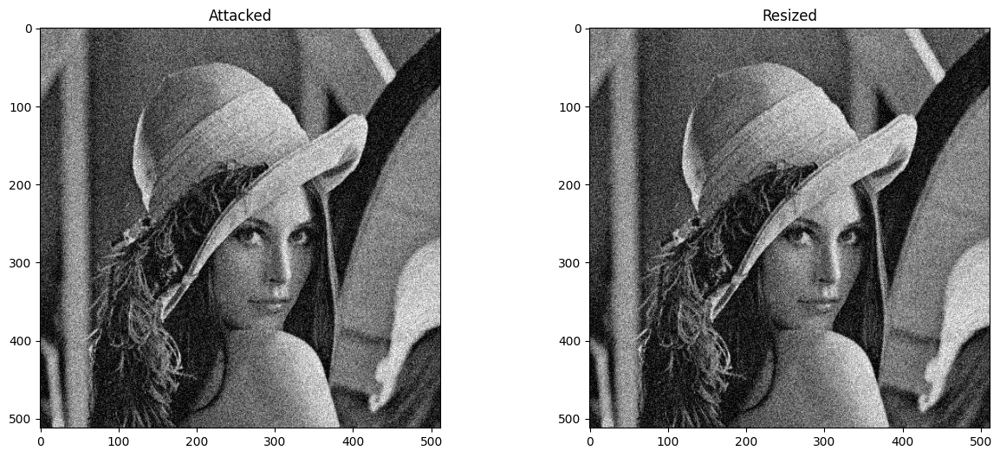

33.93351625313363


In [21]:
def resizing(attacked, scale):
  from skimage.transform import rescale
  x, y = attacked.shape
  attackedRescale = rescale(attacked, scale)
  attackedRescale = rescale(attackedRescale, 1/scale)
  attackedRescale = attacked[:x, :y]
  return attackedRescale

attackedRescale = resizing(attacked, 0.5)
print(np.shape(attackedRescale))

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Attacked')
plt.imshow(attacked, cmap='gray')
plt.subplot(122)
plt.title('Resized')
plt.imshow(attackedRescale, cmap='gray')
plt.show()

print(PSNR(attackedRescale, original[:,:,1]))

<class 'PIL.Image.Image'>
<class 'numpy.ndarray'>


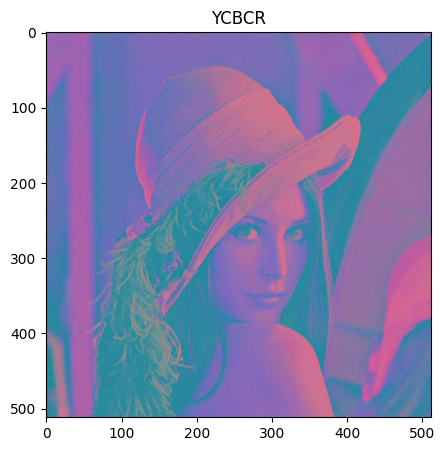

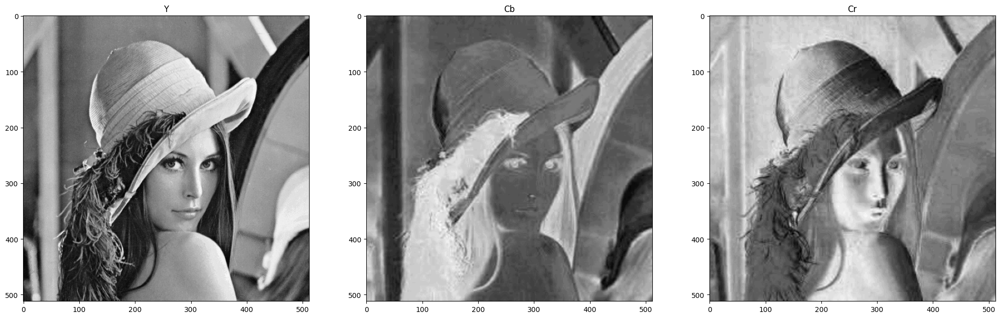

In [22]:
#Convert to YCbCr

transformed = image.convert('YCbCr')
print(type(transformed))
ycbcr = np.asarray(transformed,dtype=np.uint8)
print(type(ycbcr))
matplotlib.rcParams['figure.figsize'] = [5, 5]

# We cast the transformed values in 3x8 bits per pixel to allow visualization
plt.title('YCBCR')
plt.imshow(ycbcr)
plt.show()

matplotlib.rcParams['figure.figsize'] = [25, 25]

# Plot the 3 separate components
plt.subplot(131)
plt.title('Y')
plt.imshow(ycbcr[:,:,0],cmap='gray')
plt.subplot(132)
plt.title('Cb')
plt.imshow(ycbcr[:,:,1],cmap='gray')
plt.subplot(133)
plt.title('Cr')
plt.imshow(ycbcr[:,:,2],cmap='gray')
plt.show()

Image shape:  (512, 512, 3)


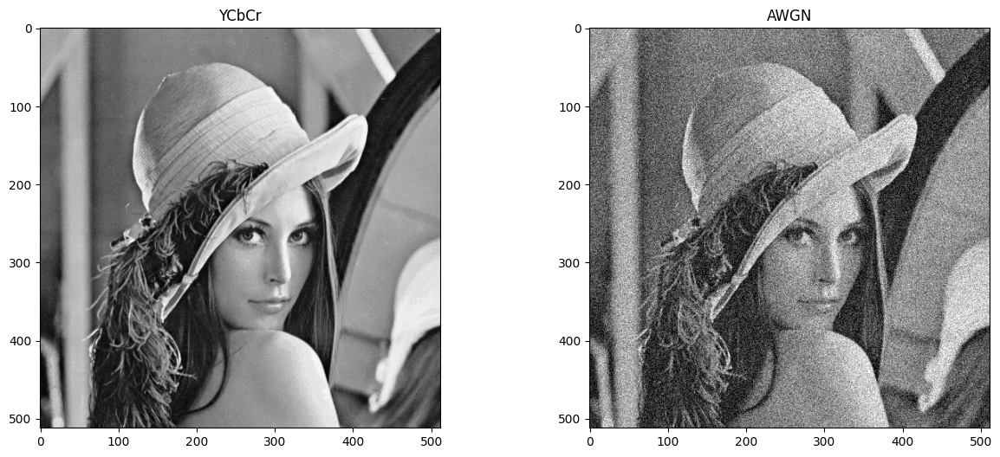

In [23]:
#AWGN

original = ycbcr
original = np.asarray(original,dtype=np.uint8)
print('Image shape: ', original.shape)

def awgn(img, std, seed):
  mean = 0.0   # some constant
  np.random.seed(seed)
  attacked = img + np.random.normal(mean, std, img.shape)
  attacked = np.clip(attacked, 0, 255)
  return attacked

attacked = awgn(original[:,:,0], 30.0, 123)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('YCbCr')
plt.imshow(original[:,:,0], cmap='gray')
plt.subplot(122)
plt.title('AWGN')
plt.imshow(attacked, cmap='gray')
plt.show()

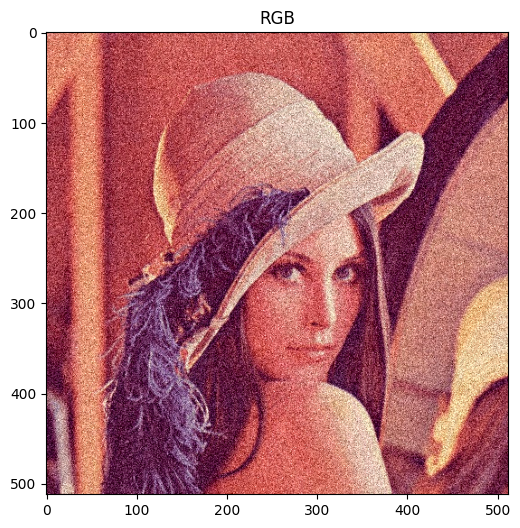

In [24]:
import cv2
import numpy as np

def ycbcr_to_rgb(ycbcr_img):
    # Separate the channels
    #Y = ycbcr_img[:, :, 0].astype(np.float32)
    Y = attacked.astype(np.float32)
    Cb = ycbcr_img[:, :, 1].astype(np.float32)
    #Cb = attacked.astype(np.float32)
    Cr = ycbcr_img[:, :, 2].astype(np.float32)
    #Cb = attacked.astype(np.float32)

    # Initialize an empty image with the same size
    rgb_img = np.zeros_like(ycbcr_img)

    # Apply the conversion formulas
    R = Y + 1.402 * (Cr - 128)
    G = Y - 0.344136 * (Cb - 128) - 0.714136 * (Cr - 128)
    B = Y + 1.772 * (Cb - 128)

    # Combine channels and clip to [0, 255]
    rgb_img[:, :, 0] = np.clip(R, 0, 255)
    rgb_img[:, :, 1] = np.clip(G, 0, 255)
    rgb_img[:, :, 2] = np.clip(B, 0, 255)

    return rgb_img.astype(np.uint8)

# Convert YCbCr to RGB manually
rgb_img_manual = ycbcr_to_rgb(original)

# Save or display the image
cv2.imwrite('image_rgb_manual.jpg', rgb_img_manual)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('RGB')
plt.imshow(rgb_img_manual)
plt.show()


Image shape:  (512, 512, 3)


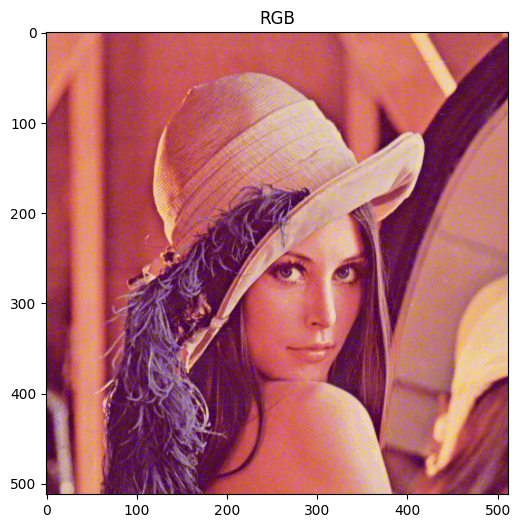

In [25]:
#AWGN

original = ycbcr
original = np.asarray(original,dtype=np.uint8)
print('Image shape: ', original.shape)

def awgn(img, std, seed):
  mean = 0.0   # some constant
  np.random.seed(seed)
  attacked = img + np.random.normal(mean, std, img.shape)
  attacked = np.clip(attacked, 0, 255)
  return attacked

attacked = awgn(original[:,:,1], 30.0, 123)

def ycbcr_to_rgb(ycbcr_img):
    # Separate the channels
    Y = ycbcr_img[:, :, 0].astype(np.float32)
    #Y = attacked.astype(np.float32)
    #Cb = ycbcr_img[:, :, 1].astype(np.float32)
    Cb = attacked.astype(np.float32)
    Cr = ycbcr_img[:, :, 2].astype(np.float32)
    #Cb = attacked.astype(np.float32)

    # Initialize an empty image with the same size
    rgb_img = np.zeros_like(ycbcr_img)

    # Apply the conversion formulas
    R = Y + 1.402 * (Cr - 128)
    G = Y - 0.344136 * (Cb - 128) - 0.714136 * (Cr - 128)
    B = Y + 1.772 * (Cb - 128)

    # Combine channels and clip to [0, 255]
    rgb_img[:, :, 0] = np.clip(R, 0, 255)
    rgb_img[:, :, 1] = np.clip(G, 0, 255)
    rgb_img[:, :, 2] = np.clip(B, 0, 255)

    return rgb_img.astype(np.uint8)

# Convert YCbCr to RGB manually
rgb_img_manual = ycbcr_to_rgb(original)

# Save or display the image
cv2.imwrite('image_rgb_manual.jpg', rgb_img_manual)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('RGB')
plt.imshow(rgb_img_manual)
plt.show()

Image shape:  (512, 512, 3)


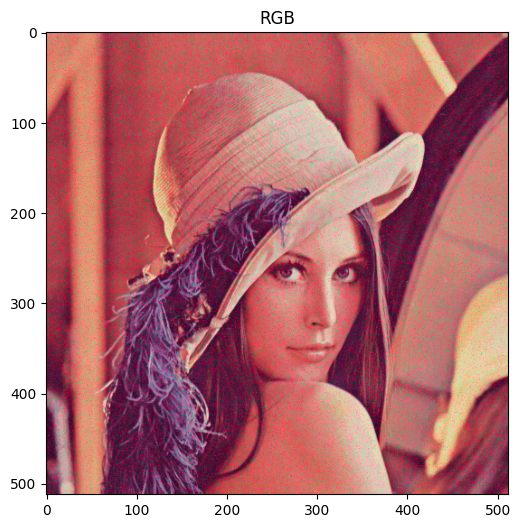

In [26]:
#AWGN

original = ycbcr
original = np.asarray(original,dtype=np.uint8)
print('Image shape: ', original.shape)

def awgn(img, std, seed):
  mean = 0.0   # some constant
  np.random.seed(seed)
  attacked = img + np.random.normal(mean, std, img.shape)
  attacked = np.clip(attacked, 0, 255)
  return attacked

attacked = awgn(original[:,:,2], 30.0, 123)

def ycbcr_to_rgb(ycbcr_img):
    # Separate the channels
    Y = ycbcr_img[:, :, 0].astype(np.float32)
    #Y = attacked.astype(np.float32)
    Cb = ycbcr_img[:, :, 1].astype(np.float32)
    #Cb = attacked.astype(np.float32)
    #Cr = ycbcr_img[:, :, 2].astype(np.float32)
    Cr = attacked.astype(np.float32)

    # Initialize an empty image with the same size
    rgb_img = np.zeros_like(ycbcr_img)

    # Apply the conversion formulas
    R = Y + 1.402 * (Cr - 128)
    G = Y - 0.344136 * (Cb - 128) - 0.714136 * (Cr - 128)
    B = Y + 1.772 * (Cb - 128)

    # Combine channels and clip to [0, 255]
    rgb_img[:, :, 0] = np.clip(R, 0, 255)
    rgb_img[:, :, 1] = np.clip(G, 0, 255)
    rgb_img[:, :, 2] = np.clip(B, 0, 255)

    return rgb_img.astype(np.uint8)

# Convert YCbCr to RGB manually
rgb_img_manual = ycbcr_to_rgb(original)

# Save or display the image
cv2.imwrite('image_rgb_manual.jpg', rgb_img_manual)

# Show orginal and edited images side by side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('RGB')
plt.imshow(rgb_img_manual)
plt.show()

/tmp/ipykernel_3274/2821716198.py:4: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


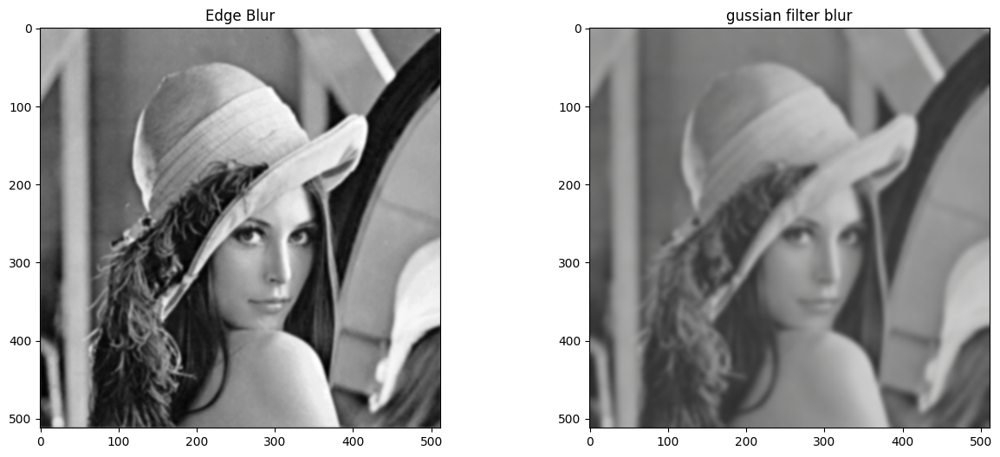

18.812093629331606
19.962263146827045


In [27]:
# Find the edges
from PIL import Image

# Add padding

image = Image.open("lena_color.jpg") 

right = 3
left = 3
top = 3
bottom = 3

width, height = image.size 

new_width = width + right + left 
new_height = height + top + bottom 

result = Image.new(image.mode, (new_width, new_height), (128, 128, 128)) 

result.paste(image, (left, top)) 

result.save('lena_padded.jpg') 



input_image=cv2.imread('lena_padded.jpg')

sobelimage=cv2.cvtColor(input_image,cv2.COLOR_BGR2GRAY)
matplotlib.rcParams['figure.figsize'] = [10, 10]


sobelx = cv2.Sobel(sobelimage,cv2.CV_64F,1,0,ksize=3)
sobely = cv2.Sobel(sobelimage,cv2.CV_64F,0,1,ksize=3)

# Compute the gradient magnitude
magnitude = np.sqrt(sobelx**2 + sobely**2)

# Optionally, scale to 8-bit to display
magnitude = cv2.convertScaleAbs(magnitude)
# Threshold the magnitude image
_, thresholded = cv2.threshold(magnitude, 100, 255, cv2.THRESH_BINARY)



th1=30
th2=90 # Canny recommends threshold 2 is 3 times threshold 1 - you could try experimenting with this...
d=3 # gaussian blur
matplotlib.rcParams['figure.figsize'] = [5, 5]

edgeresult=input_image.copy()
edgeresult = cv2.GaussianBlur(edgeresult, (2*d+1, 2*d+1), -1)[d:-d,d:-d]

gray = cv2.cvtColor(edgeresult, cv2.COLOR_BGR2GRAY)

edge = cv2.Canny(gray, th1, th2)

#edgeresult[edge != 0] = (0, 255, 0) # this takes pixels in edgeresult where edge non-zero colours them bright green
# plt.imshow(cv2.cvtColor(edgeresult, cv2.COLOR_BGR2RGB))


attacked = blur(image, 3)

# Show orginal and edited images side by side

plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.title('Edge Blur')
plt.imshow(gray, cmap='gray')
plt.subplot(122)
plt.title('gussian filter blur')
plt.imshow(attacked, cmap='gray')
plt.show()

print(PSNR(gray, original[:,:,1]))
print(PSNR(attacked[:,:,1], gray))#original[:,:,1]))


## DCT Exercise

What frequencies are THE MOST important for DCT? 

* remove the DC component
* remove low and high frequencies

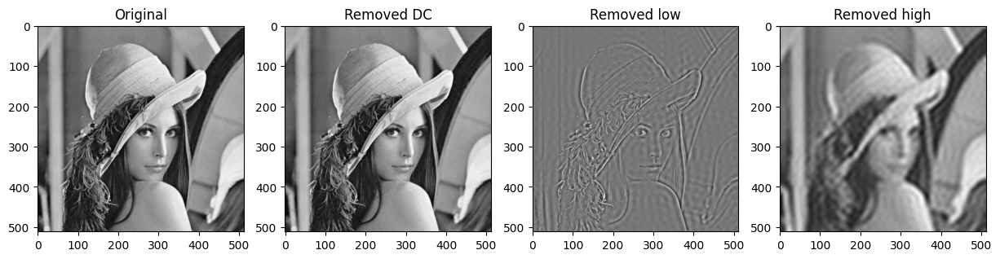

In [28]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

im = cv2.imread('lena_color.jpg', 0)
im1 = np.float32(im)/255.0

from scipy.fft import dct, idct

transform =  dct(dct(im,axis=0, norm='ortho'),axis=1, norm='ortho')

# remove DC frequencies

# Set the DC component (top-left value) to 0
transform[0, 0] = 0

# Apply inverse DCT to reconstruct the image without the DC component
edited1 = idct(idct(transform.T, norm='ortho').T, norm='ortho')

# remove low freqs

# Define the cutoff frequency (for high-pass filter)
cutoff = 50  # Remove the top-left 50x50 block of the DCT matrix

# Zero out low-frequency components (inside the cutoff block)
filtered_dct = transform.copy()
filtered_dct[:cutoff, :cutoff] = 0  # Set the top-left to zero

# Apply inverse DCT to reconstruct the high-pass filtered image
edited2 = idct(idct(filtered_dct.T, norm='ortho').T, norm='ortho')

# remove high freqs

# Define the cutoff frequency (for low-pass filter)
# Keep the top-left 50x50 block of the DCT matrix

# Zero out high-frequency components (outside the cutoff block)
filtered_dct = np.zeros_like(transform)
filtered_dct[:cutoff, :cutoff] = transform[:cutoff, :cutoff]

# Apply inverse DCT to reconstruct the low-pass filtered image
edited3 = cv2.idct(filtered_dct)


plt.figure(figsize=(15, 9))
plt.subplot(141)
plt.title('Original')
plt.imshow(im, cmap='gray')
plt.subplot(142)
plt.title('Removed DC')
plt.imshow(edited1, cmap='gray')
plt.subplot(143)
plt.title('Removed low')
plt.imshow(edited2, cmap='gray')
plt.subplot(144)
plt.title('Removed high')
plt.imshow(edited3, cmap='gray')
plt.show()

## DWT (Wavelet) Exercises:
* remove each subband and see what happens
* visualize the second level decomposition

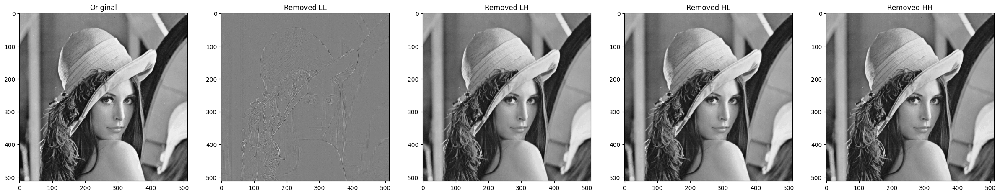

12.725714607262217
18.621185713308847
18.64701242283929
18.600104115088147


In [29]:
#your code

import pywt
coeffs2 = pywt.dwt2(im, 'haar')
LL, (LH, HL, HH) = coeffs2

#remove LL

LL_removed = np.zeros_like(LL)
LL_res = pywt.idwt2((LL_removed, (LH, HL, HH)), 'haar')

#remove LH

LH_removed = np.zeros_like(LL)
LH_res = pywt.idwt2((LL, (LH_removed, HL, HH)), 'haar')

#remove HL

HL_removed = np.zeros_like(LL)
HL_res = pywt.idwt2((LL, (LH, HL_removed, HH)), 'haar')

#remove HH

HH_removed = np.zeros_like(LL)
HH_res = pywt.idwt2((LL, (LH, HL, HH_removed)), 'haar')

# Show components
plt.figure(figsize=(30, 15))
plt.subplot(151)
plt.title('Original')
plt.imshow(im, cmap='gray')
plt.subplot(152)
plt.title('Removed LL')
plt.imshow(LL_res, cmap='gray')
plt.subplot(153)
plt.title('Removed LH')
plt.imshow(LH_res, cmap='gray')
plt.subplot(154)
plt.title('Removed HL')
plt.imshow(HL_res, cmap='gray')
plt.subplot(155)
plt.title('Removed HH')
plt.imshow(HH_res, cmap='gray')
plt.show()

print(PSNR(LL_res, original[:,:,1]))
print(PSNR(LH_res, original[:,:,1]))
print(PSNR(HL_res, original[:,:,1]))
print(PSNR(HH_res, original[:,:,1]))

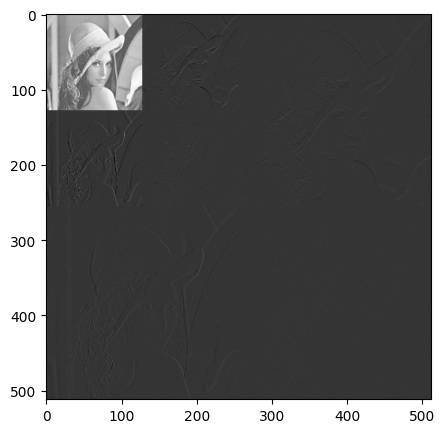

In [30]:
IDWT = pywt.idwt2((LL, (LH, HL, HH)), 'haar')
plt.imshow(IDWT, 'gray')

#import pywt
coeffs2_2 = pywt.dwt2(LL, 'haar')
LL2, (LH2, HL2, HH2) = coeffs2_2

blank_image = np.zeros((512,512), np.float32)
blank_image[:128, :128] = LL2
blank_image[:128, 128:256] = LH2
blank_image[128:256, :128] = HL2
blank_image[128:256, 128:256] = HH2
blank_image[:256, 256:] = LH
blank_image[256:, :256] = HL
blank_image[256:, 256:] = HH

# Show components
plt.imshow(blank_image, 'gray')

## Final Challenge

Do this exercise and then come to me so I can review it. It is not sure I will publish the solutions ;-)

Using the Fourier Transform, DCT or DWT, localize a specific kind of frequencies (you choose), and apply a localized attack. Which attack visually deteriorate the most the results image? Which frequencies, once attacked contribute the less to the image deterioration?

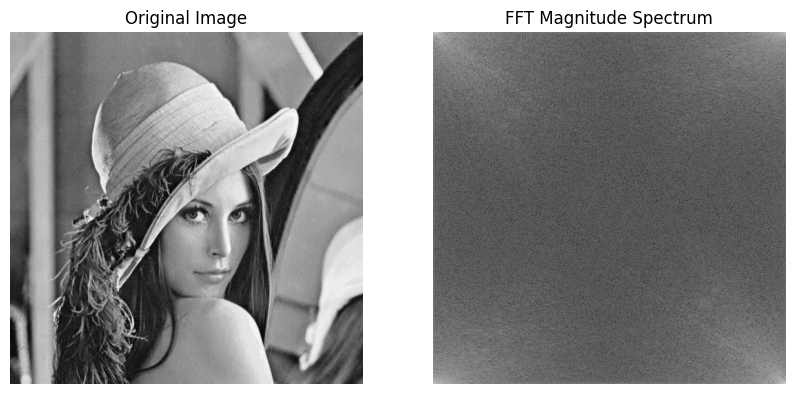

[[157 157 160 ... 166 146 124]
 [158 157 163 ... 170 148 122]
 [157 158 162 ... 167 147 124]
 ...
 [ 38  37  46 ...  99  98  94]
 [ 42  39  43 ... 102 100 101]
 [ 40  39  54 ... 102 102 103]]


/tmp/ipykernel_3274/1339609805.py:73: ComplexWarning: Casting complex values to real discards the imaginary part
  image_reconstructed = np.uint8(image_reconstructed)


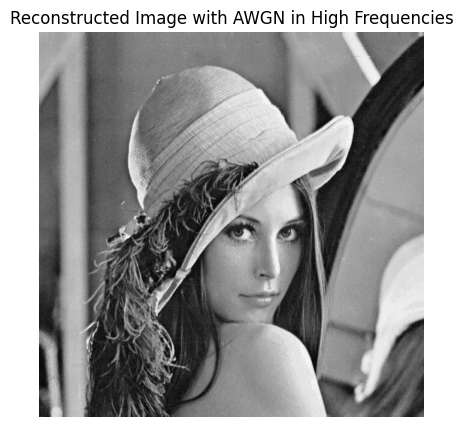

60.129856875571775


In [37]:
transform = np.fft.fftshift(np.fft.fft2(im))

# Noise mask for the outer parts (high frequencies)
rows, cols = im.shape
crow, ccol = rows // 2 , cols // 2  # Center of the image

# Define a circular mask that focuses on the outer parts
radius = 100  # Radius of the low-frequency region to protect
mask = np.ones((rows, cols), dtype=np.float32)
cv2.circle(mask, (ccol, crow), radius, 0, thickness=-1)

# Generate AWGN
# attackedAWGN = awgn(original[:,:,1], 30.0, 123)
noise = np.random.normal(0.0, 30.0, (rows, cols))

# Add noise to the high-frequency components
attackedAWGN = transform + noise * mask

# Apply inverse FFT
attackedAWGN = (np.fft.fft2(attackedAWGN))

# Plot
#plt.imshow(np.real(np.fft.ifft2(attackedAWGN)), 'gray')

import numpy as np
import matplotlib.pyplot as plt
import cv2

# Function to add AWGN
def add_awgn(image, mean=0, std_dev=10):
    """ Additive White Gaussian Noise (AWGN) """
    gauss_noise = np.random.normal(mean, std_dev, image.shape)
    noisy_image = image + gauss_noise
    return noisy_image

# Load and convert the image to grayscale
image = cv2.imread('lena_color.jpg', cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (512, 512))  # Resize for simplicity

# Perform FFT and shift the zero frequency component to the center
f_transform = np.fft.fft2(image)
f_transform_shifted = f_transform#np.fft.fftshift(f_transform)

# Compute magnitude spectrum (for visualization)
magnitude_spectrum = np.log(np.abs(f_transform_shifted))

# Display the original image and its FFT magnitude spectrum
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1), plt.imshow(image, cmap='gray')
plt.title('Original Image'), plt.axis('off')

plt.subplot(1, 2, 2), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('FFT Magnitude Spectrum'), plt.axis('off')
plt.show()

# Get the dimensions of the image
rows, cols = image.shape
crow, ccol = rows // 2 , cols // 2  # Center of the image

# Create a mask to isolate the high frequencies
mask = np.ones((rows, cols), np.uint8)
mask[crow-30:crow+30, ccol-30:ccol+30] = 0  # Preserve the low frequencies in the center

# Apply the mask to keep low frequencies and add noise to high frequencies
f_transform_shifted_high_freq = f_transform_shifted * mask

# Add AWGN to the high-frequency components only
f_transform_shifted_high_freq_noisy = add_awgn(f_transform_shifted_high_freq)

# Perform inverse FFT to reconstruct the image
f_ishift = f_transform_shifted_high_freq_noisy#np.fft.ifftshift(f_transform_shifted_high_freq_noisy)  # Shift back before inverse FFT
image_reconstructed = np.fft.ifft2(f_ishift)
image_reconstructed = np.uint8(image_reconstructed)
print(image_reconstructed)

# Display the reconstructed image with noise in high frequencies
plt.figure(figsize=(5,5))
plt.imshow(image_reconstructed, cmap='gray')
plt.title('Reconstructed Image with AWGN in High Frequencies')
plt.axis('off')
plt.show()
print(PSNR(image_reconstructed, im))
